In [8]:
import urllib.request
from PIL import Image
from matplotlib.image import imread
import numpy as np
from numpy.linalg import svd
import matplotlib.pyplot as plt
import io
from scipy.stats import entropy


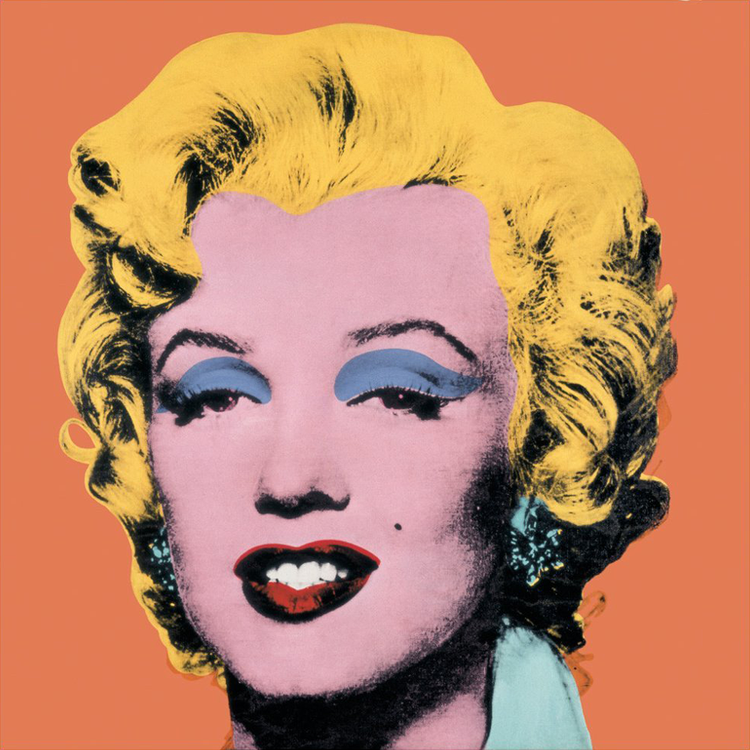

array([[[209, 117, 110],
        [223, 111, 101],
        [220, 112,  97],
        ...,
        [225, 115,  61],
        [229, 114,  71],
        [218, 118,  84]],

       [[213, 109, 100],
        [241, 113, 100],
        [241, 116,  96],
        ...,
        [227, 124,  88],
        [228, 121,  96],
        [204, 115, 101]],

       [[219, 111,  96],
        [250, 115,  95],
        [244, 111,  85],
        ...,
        [228, 118,  89],
        [234, 120, 105],
        [205, 115, 109]],

       ...,

       [[222, 115,  61],
        [226, 126,  91],
        [226, 120,  90],
        ...,
        [223, 121,  92],
        [227, 128,  91],
        [214, 118,  72]],

       [[223, 110,  67],
        [225, 122,  98],
        [228, 120, 105],
        ...,
        [224, 128,  90],
        [223, 127,  84],
        [214, 116,  63]],

       [[229, 112,  82],
        [217, 114, 102],
        [217, 111, 112],
        ...,
        [216, 121,  67],
        [220, 121,  62],
        [226, 120,  55]]

In [9]:
OrangeUrl = 'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203191222-16N8MP7K7EACDQ1EVJ7E/shot_orange_marilyn_1964-19604.png?format=750w'

with urllib.request.urlopen(OrangeUrl) as response:
    image_data = response.read()

image_bytes = io.BytesIO(image_data)

image = Image.open(image_bytes)

orange = image.convert("RGB") #gives image

orange.show()

orange_array = np.asarray(orange) #gives RGB matrix

orange_array

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import KMeans
from skimage import io, color
from sklearn.decomposition import PCA

# Load and convert the image to the desired color space
image_path = "/content/orange.png"
image = io.imread(image_path)
lab_image = color.rgb2lab(image)

# Define the regions of interest in the image (e.g., face, background, clothing)
face_region = lab_image[100:300, 100:300]
background_region = lab_image[400:600, 400:600]
clothing_region = lab_image[200:400, 600:800]

# Reshape the regions into a flattened array of pixels
face_pixels = face_region.reshape(-1, 3)
background_pixels = background_region.reshape(-1, 3)
clothing_pixels = clothing_region.reshape(-1, 3)

# Perform K-means clustering on each region to extract dominant colors
n_colors = 3  # Number of dominant colors to extract
kmeans = KMeans(n_clusters=n_colors)
face_colors = kmeans.fit_predict(face_pixels)
background_colors = kmeans.fit_predict(background_pixels)
clothing_colors = kmeans.fit_predict(clothing_pixels)

# Concatenate the dominant colors from each region
all_colors = np.concatenate((face_colors[:, None], background_colors[:, None], clothing_colors[:, None]), axis=0)

# Apply dimensionality reduction using PCA
pca = PCA(n_components=1)  # Reduce to 1 component
all_colors = pca.fit_transform(all_colors)

# Compute the pairwise distances between the dominant colors
distances = pdist(all_colors, metric='euclidean')

# Perform hierarchical clustering
clustering = linkage(distances, method='average')

# Plot the dendrogram
plt.figure(figsize=(10, 5))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Aspects')
plt.ylabel('Color Similarity')
dendrogram(clustering)
plt.show()

FileNotFoundError: ignored

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import KMeans
from skimage import io, color
from skimage.transform import resize

# Load and resize the image
image_path = "/content/orange.png"
image = io.imread(image_path)
resized_image = resize(image, (100, 100), anti_aliasing=True)

# Convert the resized image to the desired color space
lab_image = color.rgb2lab(resized_image)

# Define the regions of interest in the image (e.g., face, background, clothing)
face_region = lab_image[10:30, 10:30]
background_region = lab_image[40:60, 40:60]
clothing_region = lab_image[20:40, 60:80]

# Reshape the regions into a flattened array of pixels
face_pixels = face_region.reshape(-1, 3)
background_pixels = background_region.reshape(-1, 3)
clothing_pixels = clothing_region.reshape(-1, 3)

# Perform K-means clustering on each region to extract dominant colors
n_colors = 3  # Number of dominant colors to extract
kmeans = KMeans(n_clusters=n_colors)
face_colors = kmeans.fit_predict(face_pixels)
background_colors = kmeans.fit_predict(background_pixels)
clothing_colors = kmeans.fit_predict(clothing_pixels)

# Concatenate the dominant colors from each region
all_colors = np.concatenate(
    (face_colors[:, np.newaxis], background_colors[:, np.newaxis], clothing_colors[:, np.newaxis]), axis=0
)

# Compute the pairwise distances between the dominant colors
distances = pdist(all_colors, metric='euclidean')

# Perform hierarchical clustering
clustering = linkage(distances, method='average')

# Plot the dendrogram
plt.figure(figsize=(10, 5))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Aspects')
plt.ylabel('Color Similarity')
dendrogram(clustering)
plt.show()






FileNotFoundError: ignored

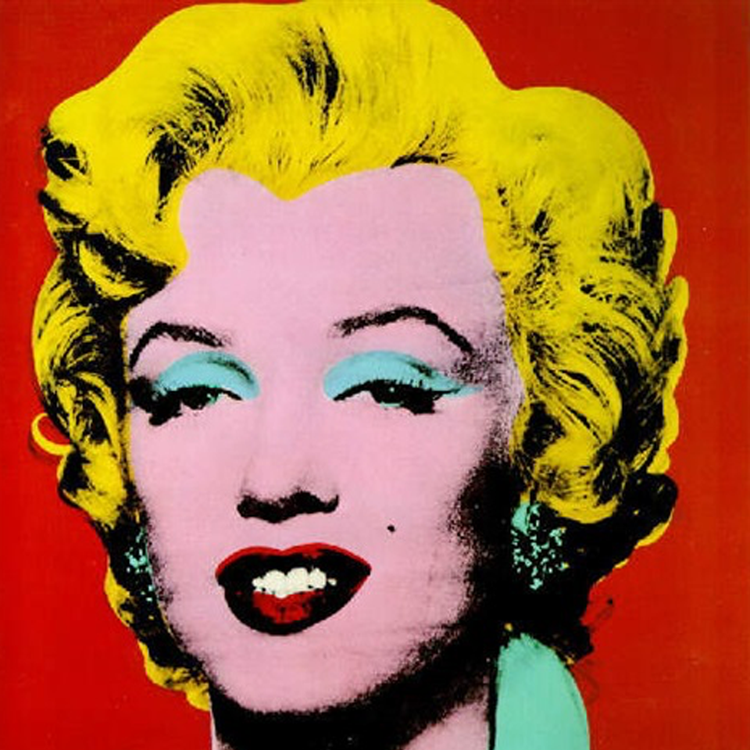

array([[[176,  26,   6],
        [178,  25,   7],
        [175,  23,   6],
        ...,
        [154,  36,   7],
        [151,  42,  11],
        [148,  46,  13]],

       [[178,  27,   7],
        [179,  27,   8],
        [177,  25,   8],
        ...,
        [155,  37,   8],
        [151,  42,  11],
        [148,  46,  13]],

       [[180,  29,   9],
        [181,  29,  10],
        [179,  27,  10],
        ...,
        [156,  38,   9],
        [152,  43,  11],
        [149,  47,  12]],

       ...,

       [[182,   3,   1],
        [182,   3,   1],
        [183,   2,   1],
        ...,
        [173,  32,   5],
        [173,  33,   5],
        [169,  31,   3]],

       [[183,   3,   1],
        [182,   3,   1],
        [183,   2,   2],
        ...,
        [174,  33,   6],
        [172,  33,   4],
        [169,  30,   2]],

       [[184,   6,   4],
        [185,   6,   4],
        [185,   5,   3],
        ...,
        [170,  36,   3],
        [168,  36,   1],
        [166,  34,   1]]

In [10]:
RedUrl = 'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203192094-MIQYNYEIJYJBY957F7T7/shot_red_marilyn_1964-19604.png?format=750w'

with urllib.request.urlopen(RedUrl) as response:
    image_data = response.read()

image_bytes = io.BytesIO(image_data)

image = Image.open(image_bytes)

red = image.convert("RGB") #gives image

red.show()

red_array = np.asarray(red) #gives matrix

red_array

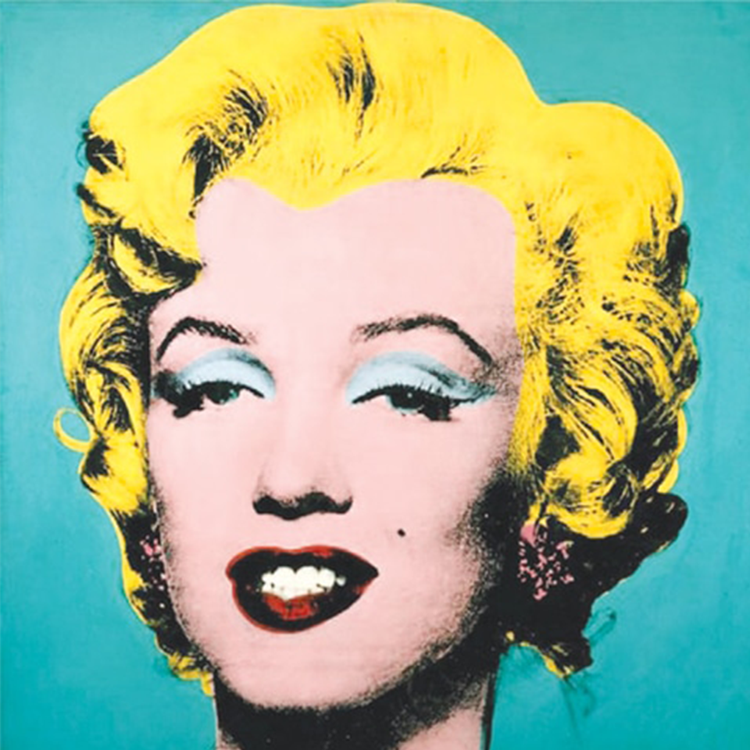

array([[[ 96, 198, 191],
        [ 92, 197, 191],
        [ 89, 194, 188],
        ...,
        [ 82, 187, 187],
        [ 84, 188, 186],
        [ 84, 188, 187]],

       [[ 87, 194, 187],
        [ 82, 192, 185],
        [ 81, 189, 182],
        ...,
        [ 73, 179, 180],
        [ 75, 180, 181],
        [ 75, 180, 181]],

       [[ 78, 185, 180],
        [ 72, 183, 178],
        [ 72, 180, 177],
        ...,
        [ 57, 170, 169],
        [ 59, 171, 170],
        [ 59, 171, 170]],

       ...,

       [[ 26, 163, 161],
        [  9, 154, 152],
        [  5, 151, 149],
        ...,
        [  2, 165, 164],
        [  1, 164, 163],
        [  1, 164, 161]],

       [[ 25, 162, 159],
        [  8, 153, 150],
        [  5, 150, 147],
        ...,
        [  2, 165, 164],
        [  1, 164, 164],
        [  1, 164, 162]],

       [[ 24, 161, 157],
        [  8, 153, 148],
        [  5, 151, 146],
        ...,
        [  2, 165, 164],
        [  1, 164, 163],
        [  1, 164, 162]]

In [11]:
TurqUrl = 'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652213792503-2Q9A294S9UOFEBQZQQNP/shot_turq_marilyn_1964-19604.png?format=750w'

with urllib.request.urlopen(TurqUrl) as response:
    image_data = response.read()

image_bytes = io.BytesIO(image_data)

image = Image.open(image_bytes)

turq = image.convert("RGB") #gives image

turq.show()

turq_array = np.asarray(turq) #gives matrix

turq_array


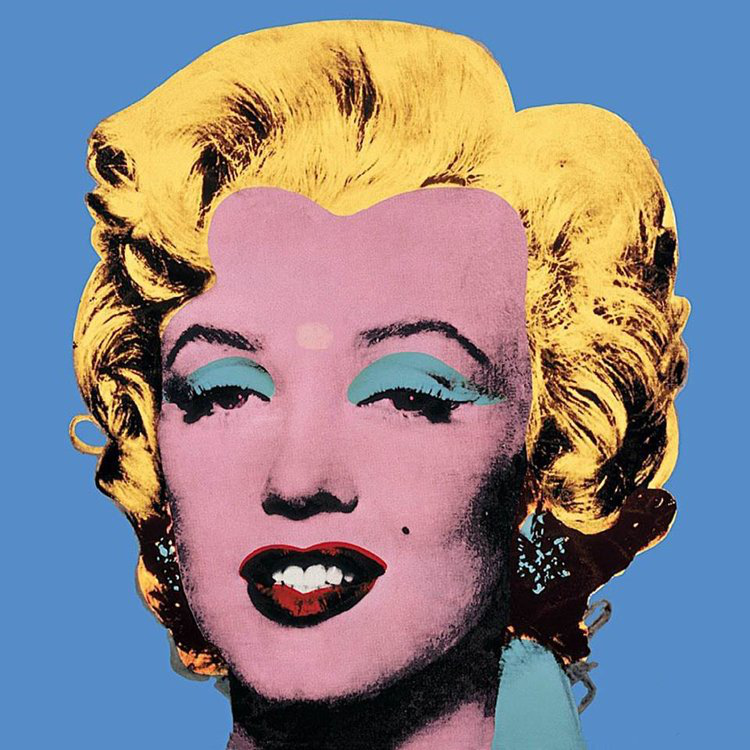

array([[[ 86, 140, 200],
        [ 86, 140, 200],
        [ 86, 140, 200],
        ...,
        [ 86, 140, 200],
        [ 86, 140, 200],
        [ 86, 140, 200]],

       [[ 86, 140, 200],
        [ 86, 140, 200],
        [ 86, 140, 200],
        ...,
        [ 86, 140, 200],
        [ 86, 140, 200],
        [ 86, 140, 200]],

       [[ 86, 140, 200],
        [ 86, 140, 200],
        [ 86, 140, 200],
        ...,
        [ 86, 140, 200],
        [ 86, 140, 200],
        [ 86, 140, 200]],

       ...,

       [[ 86, 140, 200],
        [ 86, 140, 200],
        [ 86, 140, 200],
        ...,
        [ 86, 140, 200],
        [ 86, 140, 200],
        [ 86, 140, 200]],

       [[ 86, 140, 200],
        [ 86, 140, 200],
        [ 86, 140, 200],
        ...,
        [ 86, 140, 200],
        [ 86, 140, 200],
        [ 86, 140, 200]],

       [[ 86, 140, 200],
        [ 86, 140, 200],
        [ 86, 140, 200],
        ...,
        [ 86, 140, 200],
        [ 86, 140, 200],
        [ 86, 140, 200]]

In [12]:
BlueUrl = 'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203207667-AHQD95AZ4Z1MCZ5B4C0N/shot_blue_marilyn_1964-19604.jpg?format=750w'

with urllib.request.urlopen(BlueUrl) as response:
    image_data = response.read()

image_bytes = io.BytesIO(image_data)

image = Image.open(image_bytes)

blue = image.convert("RGB") #gives image

blue.show()

blue_array = np.asarray(blue) #gives matrix

blue_array

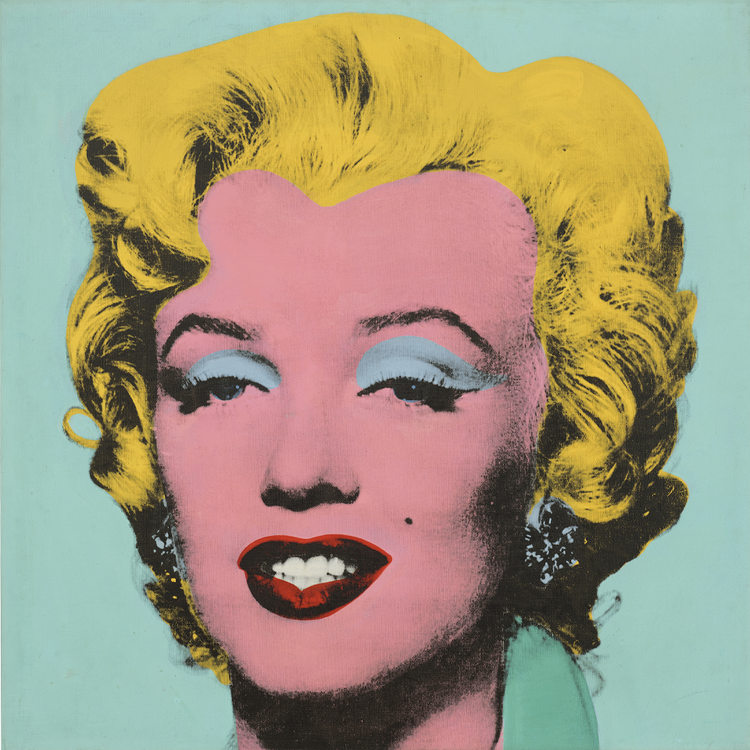

array([[[148, 181, 169],
        [151, 185, 173],
        [150, 185, 173],
        ...,
        [154, 190, 179],
        [155, 191, 180],
        [156, 190, 178]],

       [[150, 186, 175],
        [157, 190, 179],
        [150, 186, 174],
        ...,
        [154, 188, 178],
        [156, 189, 179],
        [154, 189, 176]],

       [[156, 190, 179],
        [159, 194, 183],
        [158, 193, 181],
        ...,
        [155, 191, 179],
        [155, 189, 178],
        [152, 186, 175]],

       ...,

       [[247, 249, 248],
        [169, 197, 187],
        [153, 191, 178],
        ...,
        [159, 192, 181],
        [161, 194, 183],
        [159, 194, 182]],

       [[247, 249, 248],
        [168, 195, 186],
        [150, 188, 176],
        ...,
        [155, 188, 177],
        [157, 191, 180],
        [157, 191, 179]],

       [[248, 250, 249],
        [167, 195, 184],
        [148, 186, 173],
        ...,
        [155, 190, 178],
        [152, 188, 176],
        [157, 194, 182]]

In [13]:
EggUrl = 'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203189304-UFR2YYN9605G0IW13YHJ/shot_eggblue_marilyn_1964-19604.png?format=750w'

with urllib.request.urlopen(EggUrl) as response:
    image_data = response.read()

image_bytes = io.BytesIO(image_data)

image = Image.open(image_bytes)

egg = image.convert("RGB") #gives image

egg.show()

egg_array = np.asarray(egg) #gives matrix

egg_array

In [ ]:
imread('orange')[:,:,0]
imread('orange')[:,:,1]
imread('orange')[:,:,2]

FileNotFoundError: ignored

In [ ]:
imread('red')[:,:,0]
imread('red')[:,:,1]
imread('red')[:,:,2]

FileNotFoundError: ignored

In [ ]:
imread('turq')[:,:,0]
imread('turq')[:,:,1]
imread('turq')[:,:,2]

array([[0.7490196 , 0.7490196 , 0.7372549 , ..., 0.73333335, 0.7294118 ,
        0.73333335],
       [0.73333335, 0.7254902 , 0.7137255 , ..., 0.7058824 , 0.70980394,
        0.70980394],
       [0.7058824 , 0.69803923, 0.69411767, ..., 0.6627451 , 0.6666667 ,
        0.6666667 ],
       ...,
       [0.6313726 , 0.59607846, 0.58431375, ..., 0.6431373 , 0.6392157 ,
        0.6313726 ],
       [0.62352943, 0.5882353 , 0.5764706 , ..., 0.6431373 , 0.6431373 ,
        0.63529414],
       [0.6156863 , 0.5803922 , 0.57254905, ..., 0.6431373 , 0.6392157 ,
        0.63529414]], dtype=float32)

In [ ]:
imread('blue')[:,:,0]
imread('blue')[:,:,1]
imread('blue')[:,:,2]

array([[200, 200, 200, ..., 200, 200, 200],
       [200, 200, 200, ..., 200, 200, 200],
       [200, 200, 200, ..., 200, 200, 200],
       ...,
       [200, 200, 200, ..., 200, 200, 200],
       [200, 200, 200, ..., 200, 200, 200],
       [200, 200, 200, ..., 200, 200, 200]], dtype=uint8)

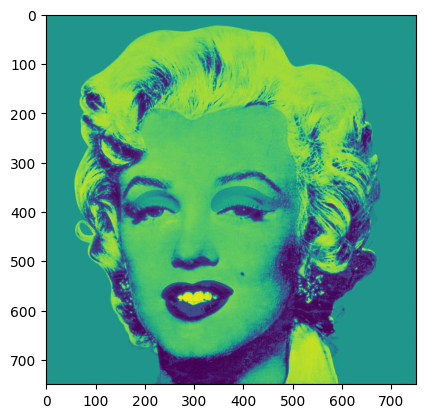

In [ ]:
imread('egg')[:,:,0]
imread('egg')[:,:,1]
imread('egg')[:,:,2]

plt.imshow(imread('orange')[:,:,1])

Extract major colors from the image:

NameError: ignored

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[[226 174 187]
 [ 72  62  54]
 [226 123  84]
 [218 172  81]
 [  8  11  13]
 [106  91  99]
 [112 134 167]
 [ 35  36  36]
 [168 126 137]
 [132  91  51]
 [243 195  89]
 [163 202 201]
 [172 135  70]
 [208 155 167]]


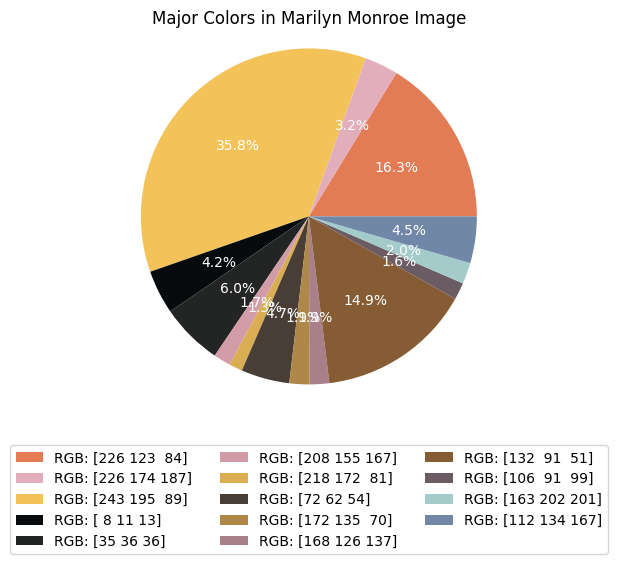

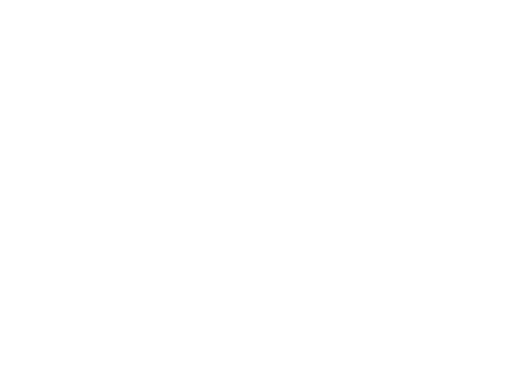

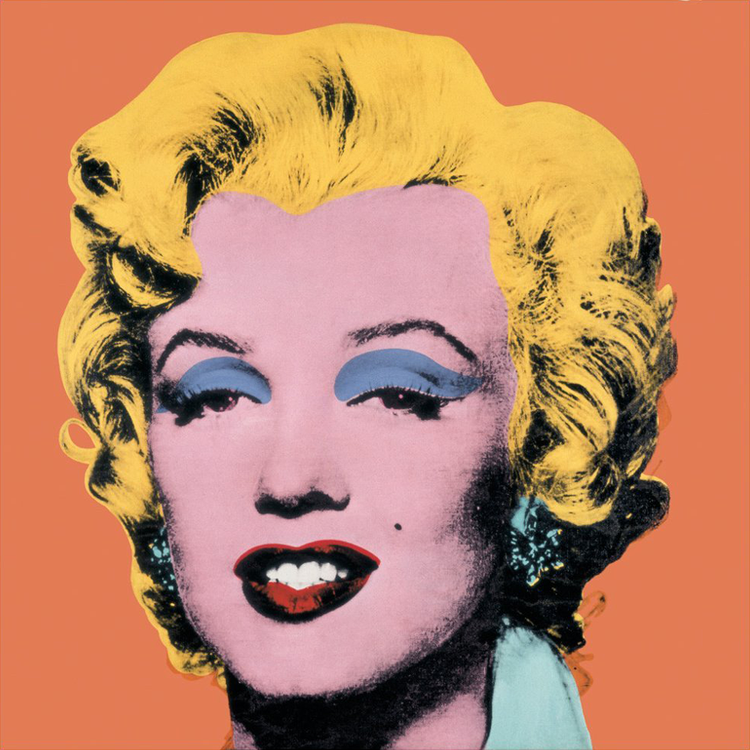

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[[211 188  12]
 [177  26   2]
 [218 164 176]
 [ 41  27  14]
 [133 111  19]
 [120 197 179]
 [ 81  62  28]
 [233 178 197]
 [115  99  94]
 [  6   3   3]
 [180 154  24]
 [180 134 139]
 [199  10   2]
 [232 208   6]]


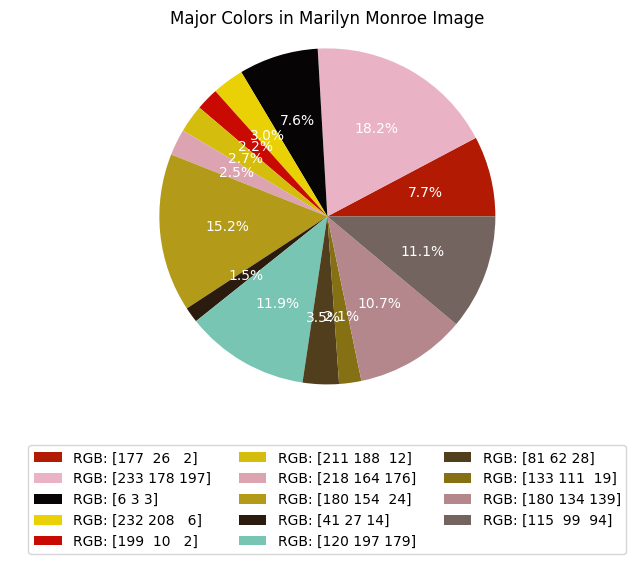

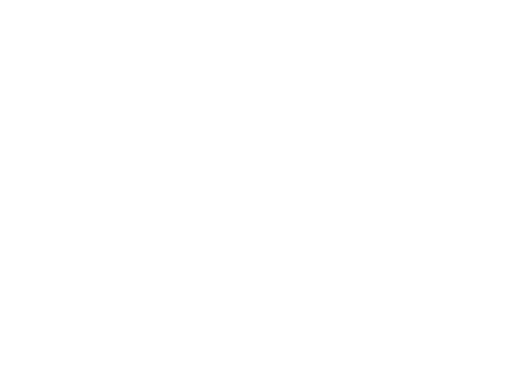

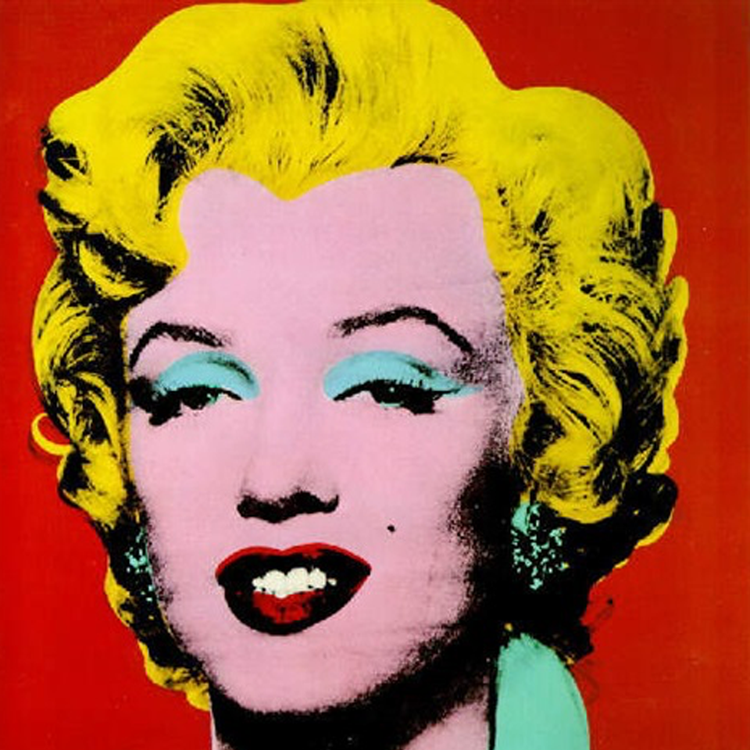

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[[ 44 179 186]
 [205 174 156]
 [199 169  64]
 [ 40  41  40]
 [249 217 215]
 [250 219  57]
 [114 202 209]
 [132 107  66]
 [239 199 192]
 [ 77 188 193]
 [ 79  76  61]
 [  8 168 174]
 [153 141 121]
 [252 232  93]]


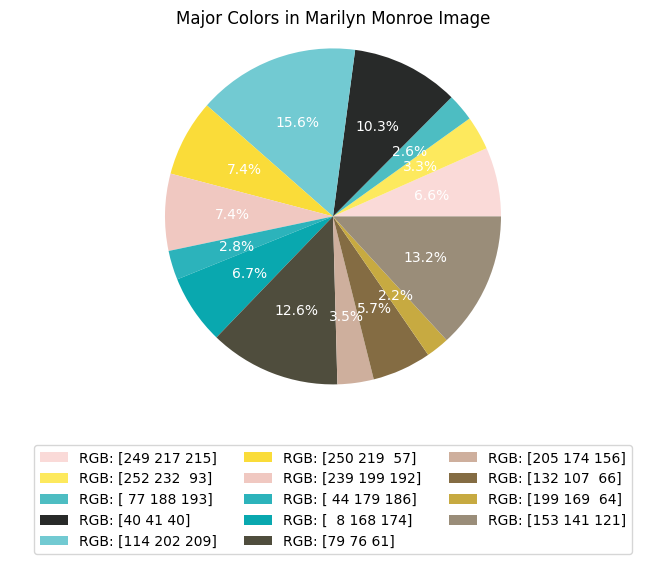

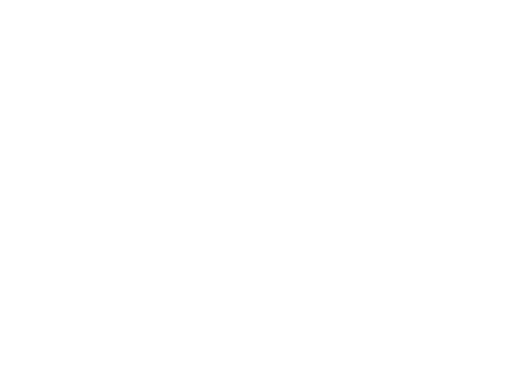

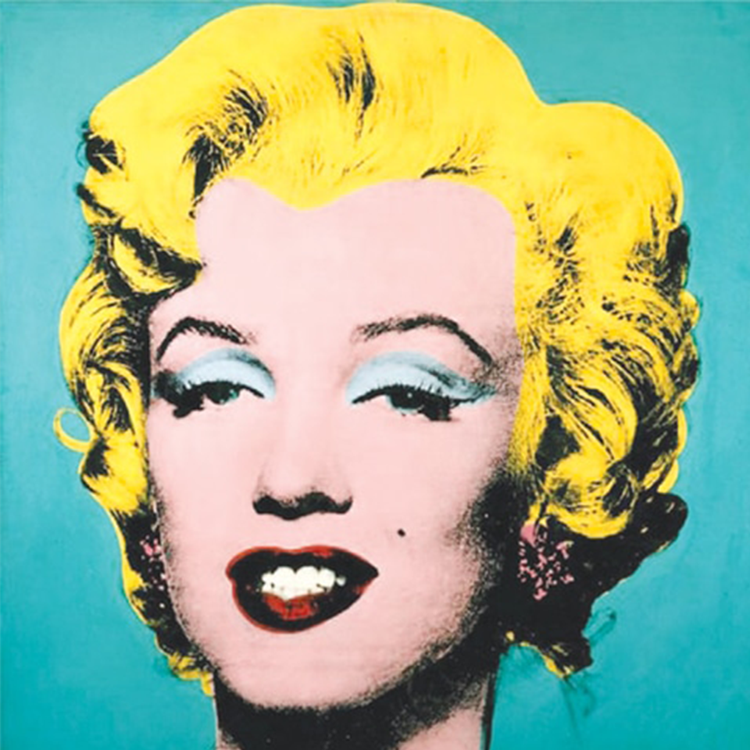

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[[248 210 108]
 [ 86 140 199]
 [ 44  29  31]
 [200 137 150]
 [146  85  44]
 [ 15   9  11]
 [233 187  89]
 [231 213 182]
 [111 155 168]
 [ 95  74  79]
 [ 96  43  19]
 [156 109 117]
 [219 154 171]
 [196 144  72]]


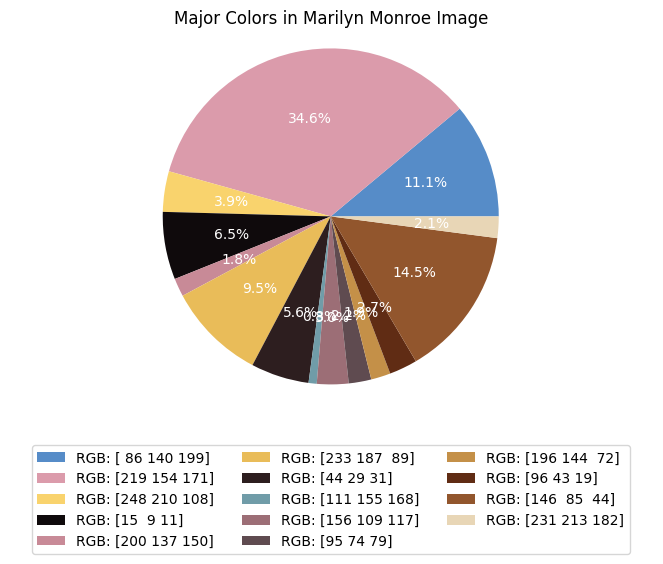

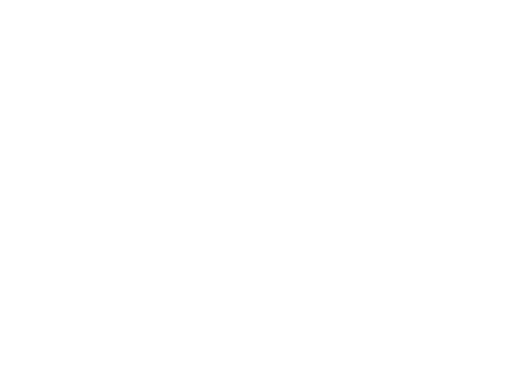

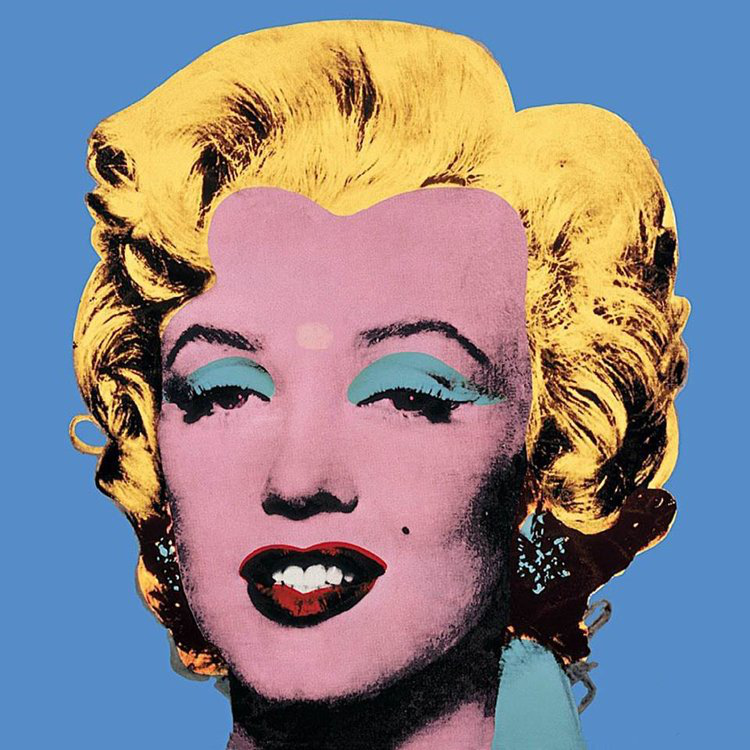

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[[172 122 124]
 [ 45  41  36]
 [160 200 191]
 [217 183  70]
 [216 146 152]
 [129 112  57]
 [167 143  60]
 [121 165 153]
 [ 92  80  61]
 [198 167  63]
 [160  51  35]
 [126 105 103]
 [202 136 141]
 [ 64  57  47]]


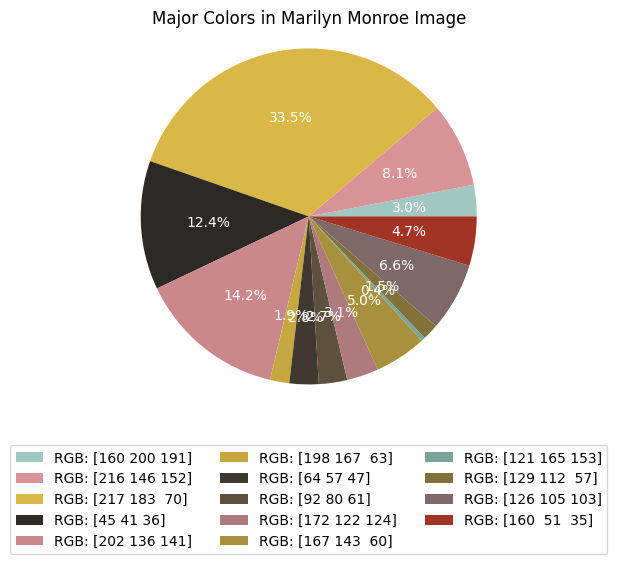

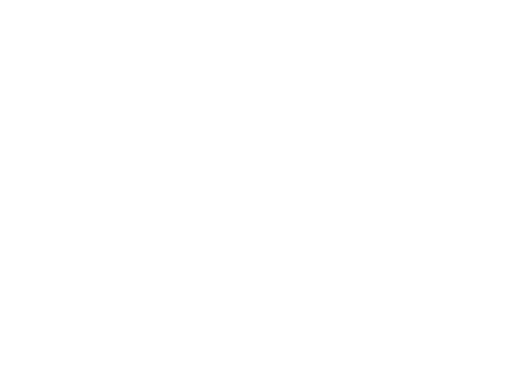

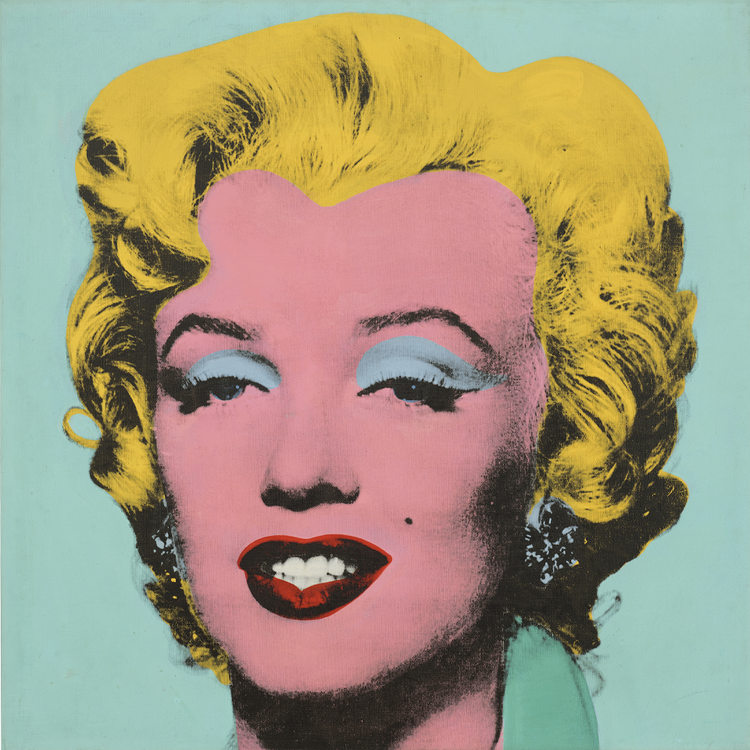

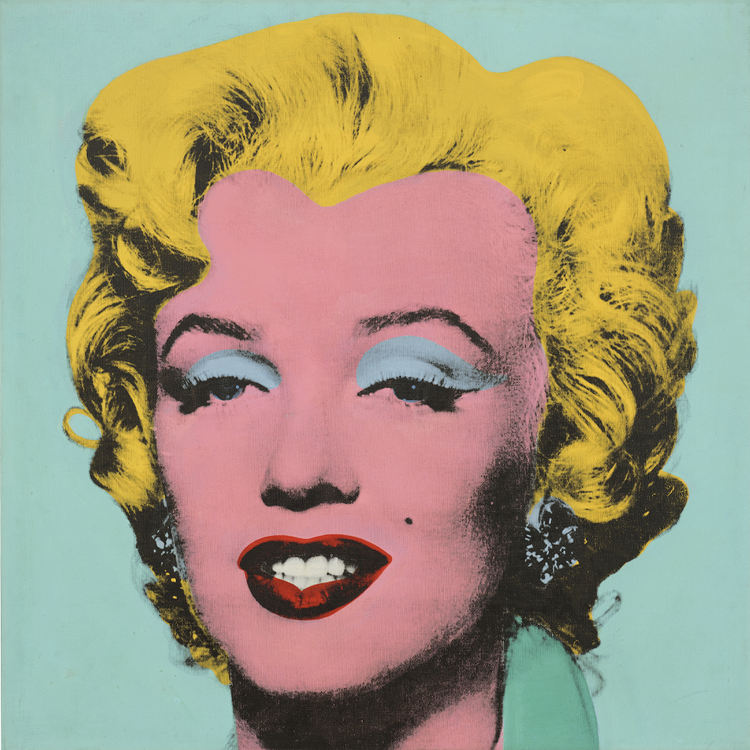

NameError: ignored

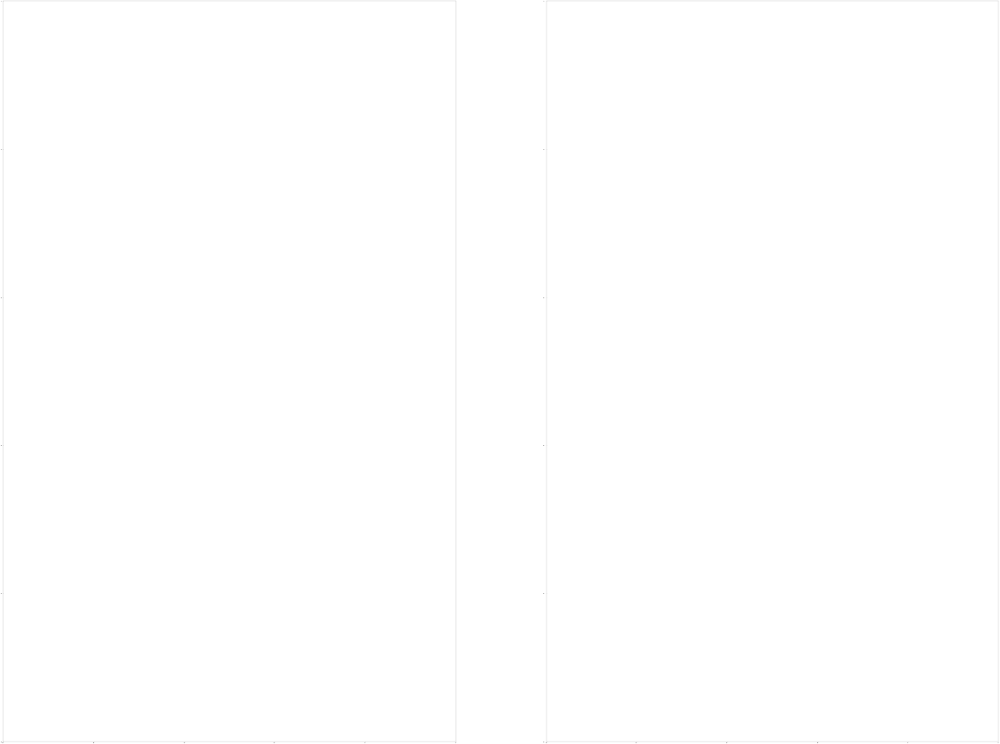

In [ ]:
urllib.request.urlretrieve(
  'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203189304-UFR2YYN9605G0IW13YHJ/shot_eggblue_marilyn_1964-19604.png?format=750w',
   "egg")

egg = Image.open("egg")

#egg.show()

#img = mpimg.imread('<photo location/name>')
bg = egg.show()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(160,120), dpi = 10)

#donut plot
wedges, text = ax1.pie(list_precent,
                      labels= text_c,
                      labeldistance= 1.05,
                      colors = list_color,
                      textprops={'fontsize': 160, 'color':'black'})
plt.setp(wedges, width=0.3)

#add image in the center of donut plot
imagebox = OffsetImage(img, zoom=2.3)
ab = AnnotationBbox(imagebox, (0, 0))
ax1.add_artist(ab)

#color palette
x_posi, y_posi, y_posi2 = 160, -170, -170
for c in list_color:
    if list_color.index(c) <= 5:
        y_posi += 180
        rect = patches.Rectangle((x_posi, y_posi), 360, 160, facecolor = c)
        ax2.add_patch(rect)
        ax2.text(x = x_posi+400, y = y_posi+100, s = c, fontdict={'fontsize': 190})
    else:
        y_posi2 += 180
        rect = patches.Rectangle((x_posi + 1000, y_posi2), 360, 160, facecolor = c)
        ax2.add_artist(rect)
        ax2.text(x = x_posi+1400, y = y_posi2+100, s = c, fontdict={'fontsize': 190})

ax2.axis('off')
fig.set_facecolor('white')
plt.imshow(bg)       
plt.tight_layout()

NameError: ignored

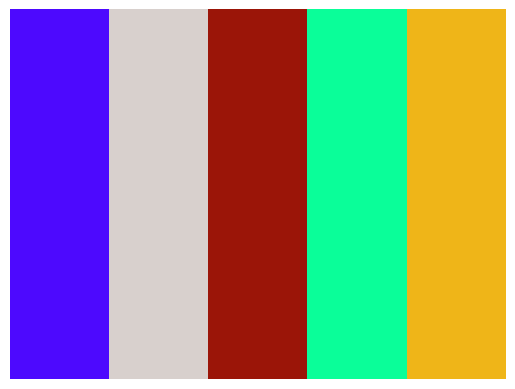

In [ ]:
import matplotlib.pyplot as plt

# Create a color palette using the major colors
color_palette = [tuple(color) for color in major_colors]

# Display the major colors
fig, ax = plt.subplots()
ax.imshow([color_palette], aspect='auto')

# Hide the axes and ticks
ax.axis('off')

# Show the plot
plt.show()

error: ignored

error: ignored

<ipython-input-44-aa75b03a4593>:29: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  color_mode = mode(pixels, axis=0).mode[0]


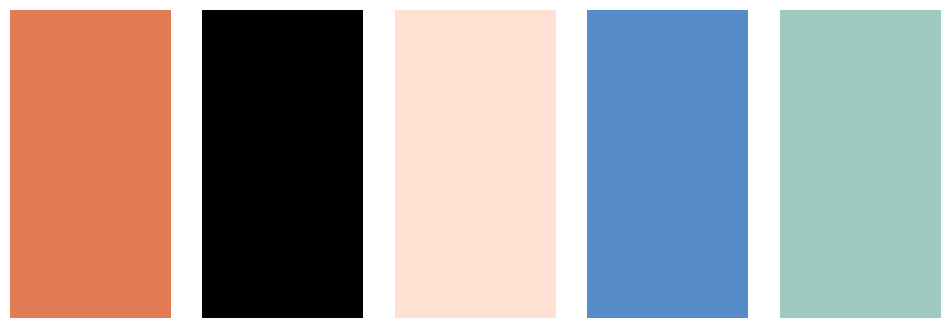

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mode
from urllib.request import urlopen
from PIL import Image

# Image URLs
image_urls = [
    'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203191222-16N8MP7K7EACDQ1EVJ7E/shot_orange_marilyn_1964-19604.png?format=750w',
    'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203192094-MIQYNYEIJYJBY957F7T7/shot_red_marilyn_1964-19604.png?format=750w',
    'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652213792503-2Q9A294S9UOFEBQZQQNP/shot_turq_marilyn_1964-19604.png?format=750w',
    'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203207667-AHQD95AZ4Z1MCZ5B4C0N/shot_blue_marilyn_1964-19604.jpg?format=750w',
    'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203189304-UFR2YYN9605G0IW13YHJ/shot_eggblue_marilyn_1964-19604.png?format=750w',
]

major_colors = []
for url in image_urls:
    # Load image from URL
    response = urlopen(url)
    image = Image.open(response)

    # Convert image to RGB color space
    image_rgb = image.convert('RGB')

    # Reshape image into a 2D array
    pixels = np.array(image_rgb).reshape(-1, 3)

    # Calculate mode of the pixels
    color_mode = mode(pixels, axis=0).mode[0]

    # Append major color to the list
    major_colors.append(color_mode)

# Display major colors
fig, ax = plt.subplots(1, len(major_colors), figsize=(12, 4))

if len(major_colors) == 1:
    ax.imshow(np.full((100, 100, 3), major_colors[0].astype(int)), aspect='auto')
    ax.axis('off')
else:
    for i, color in enumerate(major_colors):
        ax[i].imshow(np.full((100, 100, 3), color.astype(int)), aspect='auto')
        ax[i].axis('off')

plt.show()
#orange,red, turq, blue,egg

top3

<ipython-input-13-48c5de6d1adc>:14: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  color_modes = mode(pixels, axis=0).mode


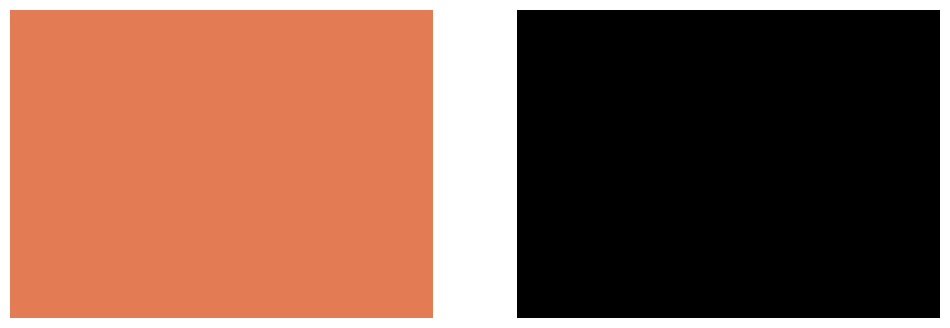

[[149 182 170]
 [255 151 185]
 [173 255 149]
 ...
 [255 153 189]
 [177 255 156]
 [193 181 255]]


ValueError: ignored